# Getting Started

This manual assumes you have already installed the packages and dependcies for PyLorentz. If you have not, follow the instructions ___here___ (link to Getting Started needed). The getting started page helps explain:
<ul>
<li>Activation of the conda environment for PyLorentz</li>
<li>Layout of the image directory for alignment and reconstruction</li>
<li>Setup of the *.fls file(s)</li>
</ul>

To run the full capabilities GUI, one additional installation is required, the installation of the modified bUnwarpJ script for bUnwarpJ alignment. This can be done as follows.
- Open a file browser and navigate to the ```/PyLorentz/GUI``` folder
- Locate the file named ```bUnwarpJ_2_images.bsh```
- Open another file browser and navigate to the Fiji installation used for image registration
- Next you will need to add the ```bUnwarpJ_2_images.bsh``` file to Fiji's Plugins

__Mac__
- Right click on Fiji and choose ```Show Package Contents```
- Open the Plugins folder
- Drag and drop the ```bUnwarpJ_2_images.bsh``` into the Plugins folder

__Windows__
- Open the ```Fiji.app/Plugins``` folder
- Drag and drop the ```bUnwarpJ_2_images.bsh``` into the Plugins folder



## Running the GUI
1. Navigate to the ```/PyLorentz/GUI``` folder.
2. Run  ```$ conda activate <PyLorentz_Env>```
3. Run ```$ python PyLorentz_GUI.py```

The GUI may take a few moments to begin, especially on the first run.

__*Note for Mac Users__
- There may be a few system authorizations necessary for subprocess to allow Fiji to run  in the background when called.
- Additionally on Macs, Finder may jump to the front of the screen if it is open. This is ok, it is a process that enables the menu options of PyLorentz specifically for Mac that are inherently capable on Windows.


# The GUI

## Menu
The menu has links to opening the main PyLorentz documentation, gives access to opening and closing the log, and has a link to opening this manual.

## Home
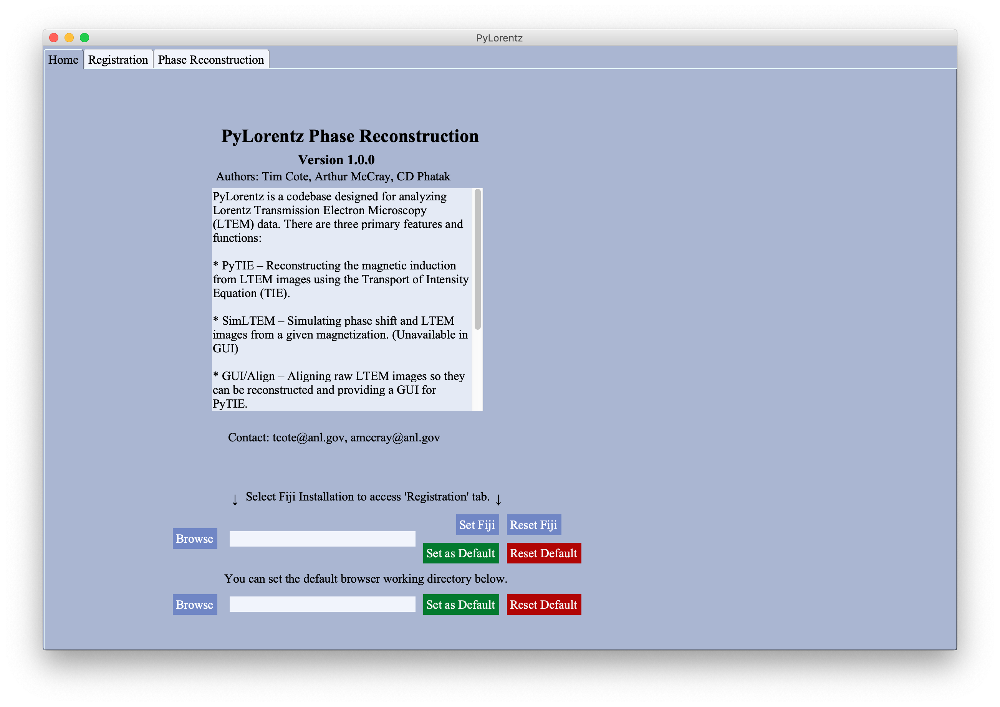

#### Setting Fiji
To perform any image registration procedures, the first thing you need to do is confirm a path to a local Fiji installation. The ```Registration``` tab can’t be accessed otherwise. On the first of the GUI, this is what the default Fiji and Browswer fields should look like.

<br>
<div>
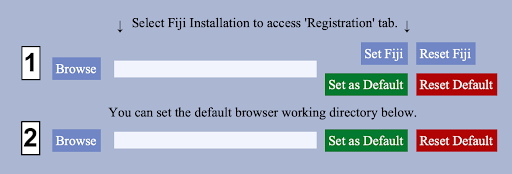
</div>

- Navigate to your Fiji installation using ```Browse (1)```. 
- Once you have confirmed a selection, the input field will fill with the Fiji path. You can manually enter the Fiji path by hand if you choose.
- Click ```Set Fiji```. Once Fiji is set, you will be able to access the ```Registration``` tab. If an incorrect Fiji installation is chosen, no change will occur and an error message will be sent to the ```Log```.
- If for whatever reason you need to reset the Fiji path, just click the ```Reset Fiji```.

#### Setting Defaults
It is likely that you will use the same Fiji installation for each registration. This may be true for the working directory where your images are stored as well. The GUI allows you to select default options for both FIJI and the working directory. 

__Fiji__
- ```Set as Default (1)``` Saves a selected Fiji path in the ```defaults.txt``` file. On subsequent uses of the GUI, this Fiji installation will already be populated in the Fiji input field. 
- ```Reset Default (1)``` Clears any Fiji path from the ```defaults.txt``` file.

__Working Directory__
- ```Browse (2)``` Navigate to and select an image working directory.
- ```Set as Default (2)``` Saves the working directory path in the ```defaults.txt``` file. On subsequent uses of the GUI, the default working directory input field will be filled as well as the working directory input fields for the ```Registration``` and ```Reconstruction``` tabs.
- ```Reset Default (2)``` Clears the working directory from the ```defaults.txt``` file.

## Registration
The GUI offers two different image alignment procedures (image registration) via subprocess routines that call two different plugins of Fiji. __Linear Stack Alignment with SIFT__ is a registration technique that aligns images utilizing scale invariant feature extraction (SIFT) based off a paper written by David Lowe. For more information on the parameters used for registering images, visit either of the following urls.

- __[Linear Stack Alignment with SIFT Plugin](https://imagej.net/Linear_Stack_Alignment_with_SIFT)__
- __[Feature Extraction](https://imagej.net/Feature_Extraction)__

The second alignment procedure, __bUnwarpJ__, was written by Ignacio Arganda-Carreras, Jan Kybic, and Albert Cardona and registers images through elastic deformations modeled as B-splines. The accuracy of registration is determined by minimize a weighted ‘energy’ function between different images. The version of bUnwarpJ used by the GUI is slightly modified from the plugin distributed by Fiji, as it is written to bypass the internal bUnwarpJ I/O. More about the parameters of bUnwarpJ can be found here and in the Feature Extraction link above.

- __[bUnwarpJ](https://imagej.net/BUnwarpJ)__

All examples and images below are from images that come from the MDF Example as stated in PyLorentz's __Getting Started__.

### Linear Stack Alignment with SIFT

The Linear Stack Alignment with SIFT alignment protocol (LS SIFT) utilizes an infocus image as a reference image for all other images to align to. This has better accuracy and more success than loading an image stack from largest underfocus to largest overfocus and performing the LS SIFT alignment in Fiji. The following is an example for how a double-sided tfs using the unflipped infocus image as a reference would be made in Fiji.

1. Load unflipped underfocus images in increasing magnitude of defocus:
                u_infocus.dm3 -> -u1.dm3 -> -u2.dm3 -> -u3.dm3
2. Create an image stack and perform LS SIFT alignment.
3. Delete the infocus image from the stack and reverse the order of the stack, so largest defocus is the first slice.
4. Load unflipped overfocus images in increasing magnitude of defocus:
                u_infocus.dm3 -> +u1.dm3 -> +u2.dm3 -> +u3.dm3
5. Create an image stack and perform LS SIFT alignment.
6. Load flipped underfocus images in increasing magnitude of defocus:
                u_infocus.dm3 -> -f1.dm3 -> -f2.dm3 -> -f3.dm3
7. Create an image stack.
8. Apply a horizontal flip and any pre-alignment rotations/translations to speed up registration.
9. Perform LS SIFT alignment.
10. Delete the infocus image from the stack and reverse the order of the stack, so largest defocus is the first slice.
11. Load flipped infocus image to make a stack:
                u_infocus.dm3 -> f_infocus.dm3
12. Create an image stack.
13. Apply a horizontal flip and any pre-alignment rotations/translations to speed up registration.
14. Perform LS SIFT alignment (Don't delete unflipped infocus image yet as it will mess with final registration).
15. Load unflipped overfocus images in increasing magnitude of defocus:
                u_infocus.dm3 -> +f1.dm3 -> +f2.dm3 -> +f3.dm3
16. Create an image stack and perform LS SIFT alignment.
17. Delete the unflipped infocus image.
18. Concatenate all stacks, remembering to delete the unflipped infocus image from the reference flipped stack. The final stack should have the order
                                                   -u3.dm3 
                                                   -u2.dm3 
                                                   -u1.dm3 
                                             u_infocus.dm3
                                                   +u1.dm3 
                                                   +u2.dm3 
                                                   +u3.dm3 
                                                   -f3.dm3 
                                                   -f2.dm3 
                                                   -f1.dm3 
                                             f_infocus.dm3 
                                                   +f1.dm3 
                                                   +f2.dm3 
                                                   +f3.dm3
    This will __always__ be the format of the output stack, regardless of which reference image may be chosen. The only difference is for a single-sided tfs, there will only be one orientation.
19. Save the aligned image stack.



__HOW TO USE:__
1. Set the image working directory. This will allow access to the FLS Frame and ```Set FLS```.
2. Load \*.fls files. Choose whether to perform a double-sided (unflip/flip) tfs alignment or a single-sided tfs alignment (tfs). Then select the number of \*.fls files to use. When \*.fls file(s) have been chosen, ```Set FLS``` will become enabled. 
    - If one \*.fls file is used for a double sided alignement, the file names must be the same in both the unflip and flip folders.
    
    - Sometimes the file won't register when loading is selected, try selecting it again if it doesn't appear after selection.

3. Sometimes one reference image may have an easier time aligning than the other. Choosing unflip or flip will utilize the reference image from that respective folder. The output aligned stack will still be in the order above.
4. Pressing ```Set FLS``` will give assess to ```Run Align```. You can keep track of which image is loaded beneath the display graph.
 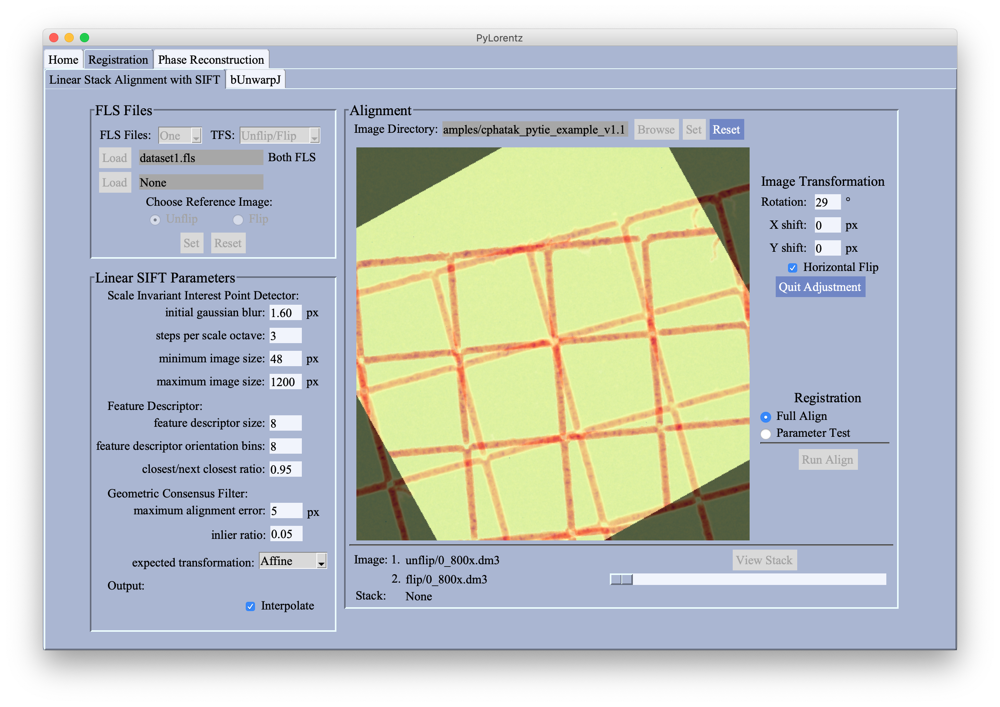   - When an directory is setup incorrectly with unflip/flip/tfs folders or the \*.fls files don't match the contents of these folders, and error will be sent to the ```Log```. Make sure your format follows the format described in __Getting Started__.

5. Set the SIFT alignment parameters, refer to the Feature Extraction page on Fiji for more information.
    - If any error occurs when attempting to run and alignment, check the Log and see whether or not the feature parameter input is correct. Some values need to be above 0 or need to be an integer. Likewise the minimum image size should not be larger than the maximum image size.

6. Pre-aligning the images manually will help speed up the SIFT alignment process. Pressing ```Adjust Image``` will overlay the infocus images of the flip an unflip folders. Changing the inputs for rotation and translation will update the transformation of the image. Additionally, the images of the opposite flipped orientation need to have a flip applied. The GUI applies a horizontal flip. When satisfied press ```Quit Adjustment```.
    - Adjusting is disabled for a single-sided tfs.
    - Make note if you are applying the image transformations in Fiji itself, the y-axis translations will be inverted.

7. The alignment has two options, a ```Full Align``` and ```Paramter Test```. To check to see if the SIFT parameters set in the ```Linear SIFT Parameters``` frame, the parameter test will only align the reference images and images one defocus step on either side of the alignment. Utilizing the example at the start of this section, the output in this case for a double-sided tfs stack would be:
 
                                                   -u1.dm3 
                                             u_infocus.dm3
                                                   +u1.dm3 
                                                   -f1.dm3 
                                             f_infocus.dm3 
                                                   +f1.dm3
                                                   
8. Choosing ```Full Align``` will output the full stack of images from the example at the start of this section. When ready to start an alignment press ```Run Align```. A save window will pop up where you can name your stack. If the name is already saved in the current working directory, there is an option to overwrite any existing stacks with that name. Quiting the save window or exiting will not run any alignment. The aligned stack is saved in the current image directory.

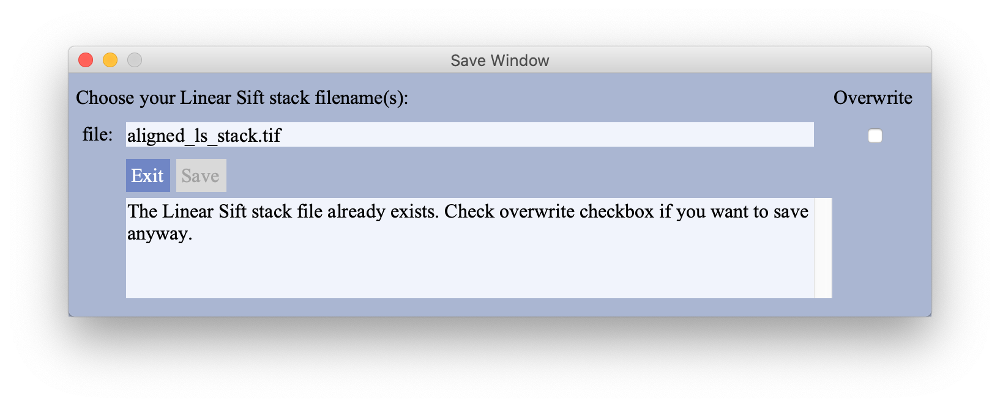
9. While the alignment is running you can track its progress in the ```Log``` underneath the Fiji tab. The same output that would appear in Fiji's log will appear here.
10. If no errors occur, a stack will load and you can view it in the main display by pressing ```View Stack```. Place the cursor over the stack display and scroll through the image slices or use the scroll bar.
11. To start over select, ```Reset FLS``` or ```Reset``` above the display. This will quit any running processes as well if they get stuck.


### bUnwarpJ

Similar to LS SIFT, bUnwarpJ used the infocus images reference image for all other images to align to. However, to get the same fully aligned stack this bUnwarpJ procedure has a 3 step process. First all images of the unflip orientation are aligned using LS SIFT and the stack is saved. The same is done with all images of the flip orientation. Lastly, the two reference images are aligned using bUnwarpJ. One image is referred to as the source and it is aligned to the target. The transformation that deforms the source to the target is saved. This transformation is then applied to all images in the stack that are the same orientation as the source image. Here is an example how to apply this procedure in a tfs where the unflip orienation is the reference.

1. Use LS SIFT to make an aligned stack for the unflipped orientation and save the stack.
2. Use LS SIFT          ''            ''    the flipped orientation and save the stack.
3. Open the unflip infocus image (__target__) and the flip infocus image (__source__).
4. Apply horizontal flip and apply any pre-transformation rotations/translations.
5. Under plugins, choose Feature Extraction with SIFT to get landmarks.
5. (Optional) Create or load masks to help mask out NAN regions in a rotated/translated image.
5. Run bUnwarpJ alignment, aligning the source to the target image. Save the transformation.
6. Using bUnwarpJ, apply the transformation to all slices in the stack that share the same orientation as the source.
7. Concatenate the stacks, the final stack should have the order like the following:
                                                   -u3.dm3 
                                                   -u2.dm3 
                                                   -u1.dm3 
                                             u_infocus.dm3
                                                   +u1.dm3 
                                                   +u2.dm3 
                                                   +u3.dm3 
                                                   -f3.dm3 
                                                   -f2.dm3 
                                                   -f1.dm3 
                                             f_infocus.dm3 
                                                   +f1.dm3 
                                                   +f2.dm3 
                                                   +f3.dm3
    This is the same format from the LS SIFT procedure.
8. Save the aligned image stack.

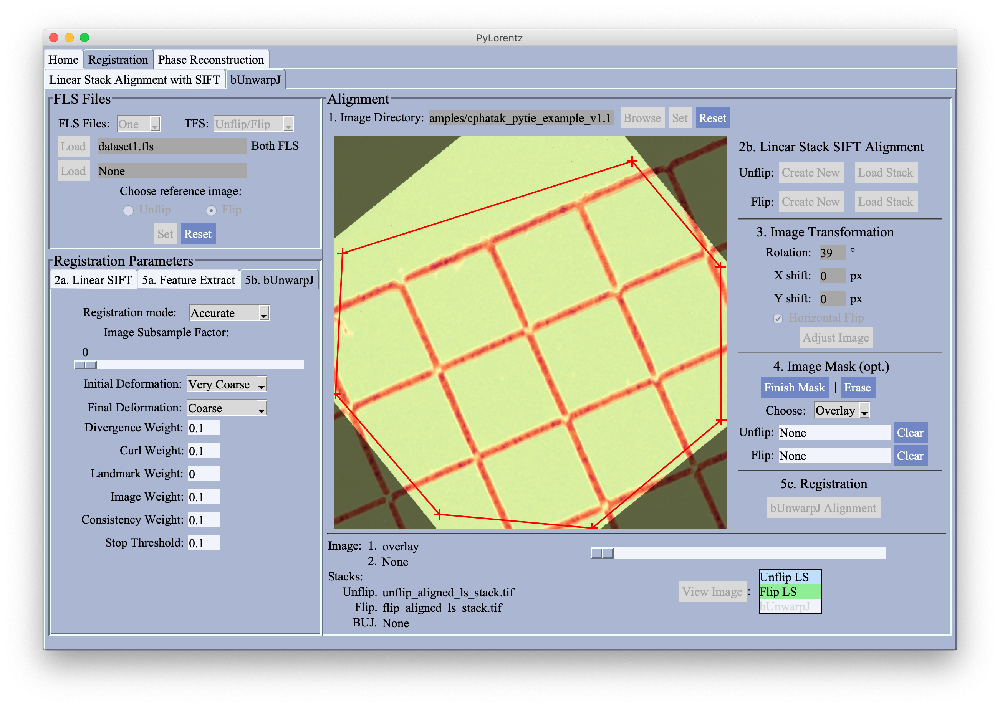

__HOW TO USE:__
1. Set the image working directory. This will allow access to the FLS Frame and ```Set FLS```.
2. Load \*.fls files. Only a double-sided (unflip/flip) tfs alignment works for bUnwarpJ. Then select the number of \*.fls files to use. When \*.fls file(s) have been chosen, ```Set FLS``` will become enabled. 
    - If one \*.fls file is used for a double sided alignement, the file names must be the same in both the unflip and flip folders.
    - Sometimes the file won't register when loading is selected, try selecting it again if it doesn't appear after selection.

3. Sometimes one reference image may have an easier time aligning than the other. Choosing between which orientation will be the refference.
4. Pressing ```Set FLS``` will give access to creating unflip/flip stacks, pre-adjusting the infocus images, and mask making.
    - When an directory is setup incorrectly with unflip/flip/tfs folders or the \*.fls files don't match the contents of these folders, and error will be sent to the ```Log```. Make sure your format follows the format described in __Getting Started__.
5. Set the Feature Extraction parameters for making the unflip/flip stacks in the ```Linear SIFT``` tab of the ```Registration Parameter``` frame and run ```Create New```. Otherwise, if these stacks are already made, they can be loaded with the ```Load Stack``` buttons. Be warned if loading stacks that the orientation corresponds to the orientation indiciated, there is no way for the GUI itself to be able to tell the difference based on the images in the stack. The aligned stacks are saved in the current image directory.
6. Optionally adjust the infocus images to be pre-aligned with ```Adjust Image``` to improve speed and accuracy of registration. If adjustments are made it is highly recommended to create masks for the image.
7. (Optional) Start creating image masks by selecting ```Create Mask```. By choosing 'unflip' or 'flip', you can create a mask directly for that infocus image that orientation corresponds to. If you choose 'overlay', you can make masks simultaneously for both images. 
    - To make a mask, click on the display graph around the area the region that is to be aligned. Double-clicking will complete the mask polygon. Do not cross any lines of the polygons border, or bUnwarpJ register properly.
    - Save the mask by clicking ```Finish Mask``` or erase the mask by clicking ```Erase```.
    - If saving, the save window will pop up, where the masks can be named and saved. If ```Save``` is not clicked or the window is exited, the masks won't be saved.
    - Additionally, already made masks can be loaded with ```Load Mask``` when not creating other mask.
    - Masks can be cleared after creation or loading with the ```Clear``` buttons. This does not delete the saved masks themselves in storage.
8. Immediately after both the unflip and flip stacks are loaded, the ```bUnwarpJ Alignment``` button will be available. Set the parameters for ```Feature Extract``` and ```bUnwarpJ``` in the ```Registration Parameter``` frame. Once the parameters are set, click ```bUnwarpJ Alignment```. The save window will pop up where the save names for the stack and the transformation file will be. The transformation file is saved in the ```buj_transforms``` folder while the aligned stack is saved in the current image directory. If files may be overwritten, the user must confirm the overwrite.
9. Viewing loaded stacks can be done with ```View Stack```. Stacks highlighted in green can be loaded into view. An error is sent to ```Log``` if trying to view an unloaded stack. Slices of the stack can be viewed using the scroll bar or by hovering the cursor over the display and scrolling with the mousewheel.


## Reconstruction
The GUI version of the jupyter notebook meant for solving the transport of intensity equation (TIE) and finding magnetic induction from an experimental through focal series (tfs) of TEM images. For more information go to the  wiki/documentation pages. LINK LINK LINK LINK

Compared to the notebeook, the GUI has better capabilities of manipulating the ROI for the returned reconstructed images and allows easier viewing of the images as well. The capabilities of the reconstruction itself are the same.

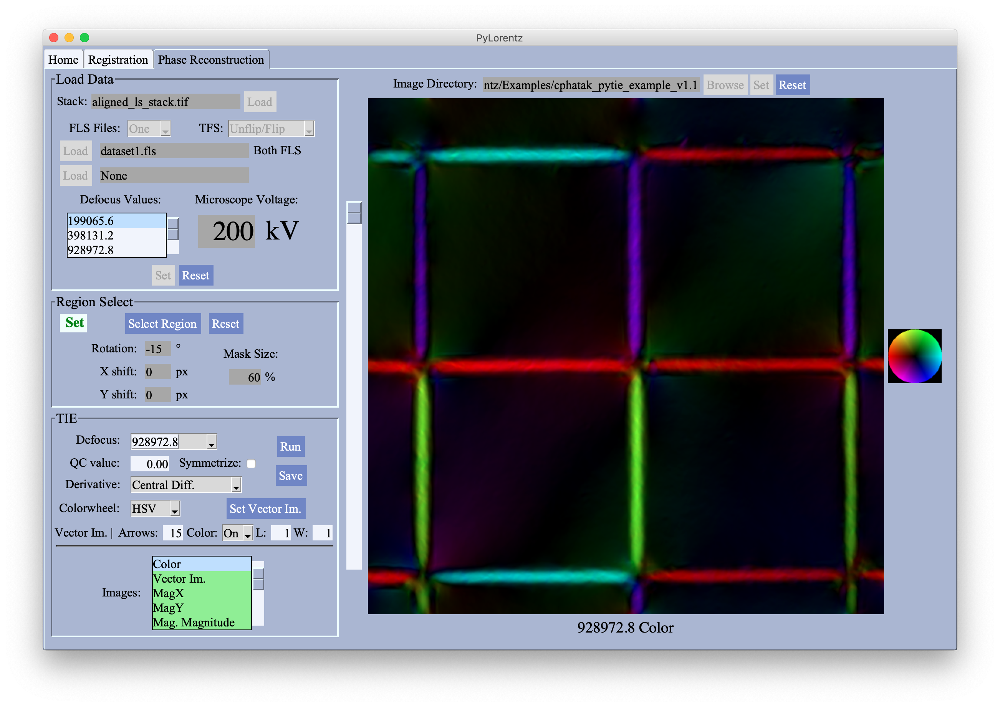

__HOW TO USE:__
1. Set the image working directory. This will allow access to the FLS Frame and ```Set FLS```.
2. Load an aligned image stack from LS SIFT or bUnwarpJ.
3. Load \*.fls files. Choose whether to perform a double-sided (unflip/flip) tfs alignment or a single-sided tfs alignment (tfs). Then select the number of \*.fls files to use. When \*.fls file(s) have been chosen, ```Set FLS``` will become enabled. 
    - If one \*.fls file is used for a double sided alignement, the file names must be the same in both the unflip and flip folders.
    - The \*.fls file and the tfs selection should match the stack. Ie. loading a stack aligned with bUnwarpJ won't work if the tfs value is 'Single'. Any errors with selection of stack and \*.fls files will appear in the ```Log```.
    - Sometimes the file won't register when loading is selected, try selecting it again if it doesn't appear after selection.
4. Set the accelerating voltage for the microscope, and click ```Set FLS```. This will initialize the PTIE parameters.
5. Once initialization is complete, the ROI of the stack will be reduced as only areas common to all images will appear in a reconstructed image.
6. (Optional) Adjust the selected region of interest by clicking ```Select Region```. A mask can be applied along with rotations/translations to the images in the stack. The size of the mask can be adjusted and it can be moved around the display by dragging the center of the mouse on the display where the center of the mask should be. Reset any changes using ```Reset```. If a mask region is selected, the ROI on display in the graph will be reduced, indicating this will be the region for reconstruction.
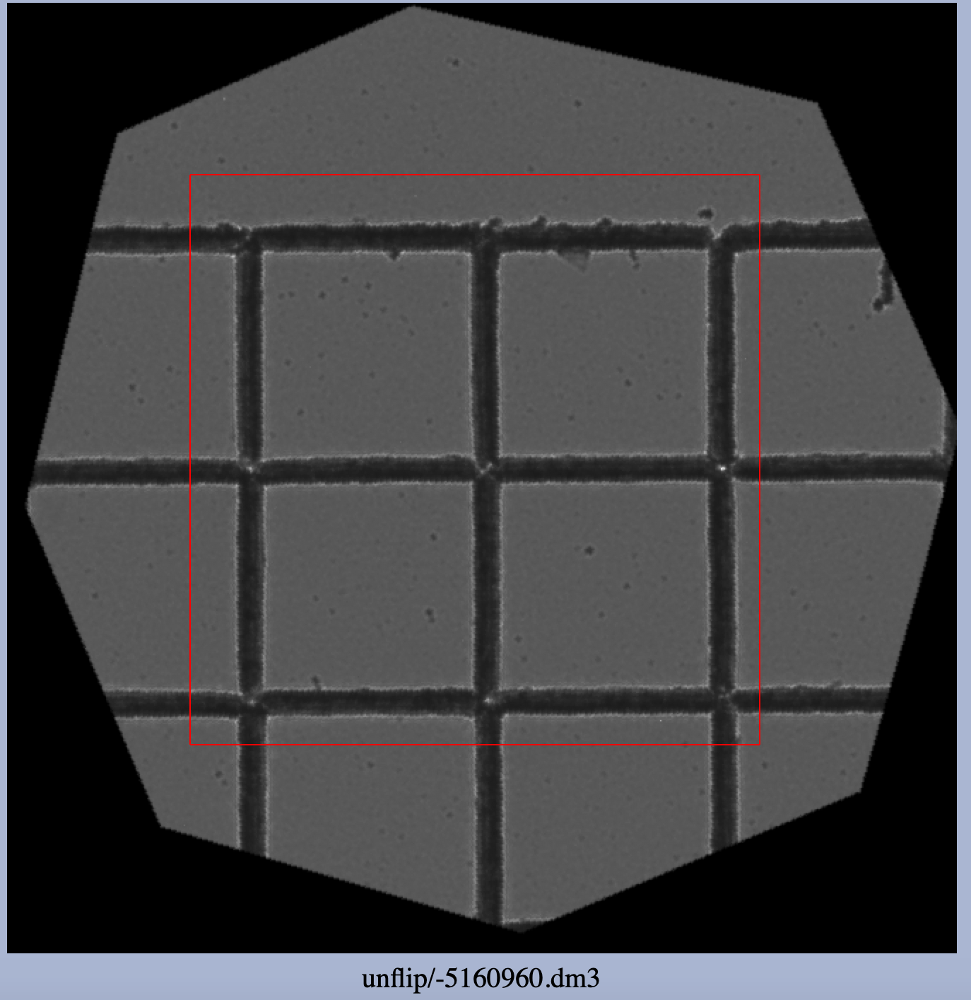
7. Choose the parameters for the reconstruction. Select betweehn the different defocus values, the QC value, symmetrization, the type of the colorwheel, etc. When satisfied click ```Run```. After a few moments the images will be loaded and can ve selected in the Image Choices box. View the images by selecting those highlighted in green.
    - Image not highlighted in green can't be viewed. For a single-sided tfs, neither the electrostic phase or electrostatic derivative can be viewed.
    - Refer to the PyTIE template notebook for or wiki for more information on the reconstructed images.
8. If satisfied with the images, they can be saved. No images will be saved if ```Save``` is not clicked and the window is exited. If files will be overwritten, it must be agreed to by the user. A prefix for labeling the images can be set. There are different options for saving different images. 
    - The color image only.
    - The color image, x-magnetic induction, y-magnetic induction and vectorized magnetic saturation plots.
    - All images will be saved.
    - No imags will be saved.


## Log

The log keeps track of any output, misclicks or errors that occur while using the GUI. It is useful for keeping track of which tabs have been entered for any documentation of errors by noticing the different prefixs:
    
    - HOM: Home Tab
    -  LS: Linear Sift Tab
    - BUJ: bUnwarpJ Tab
    - REC: Reconstruction Tab

Any output from any alignments will occur under the ```Fiji``` tab. All other output falls under ```Main```. The log should be the first place ot check if you expected something to happen and don't know why it happened. The log can be accessed from the Menu or by pressing ```Control + l``` on your computer. It can be easily hidden with ```Control + h```.
    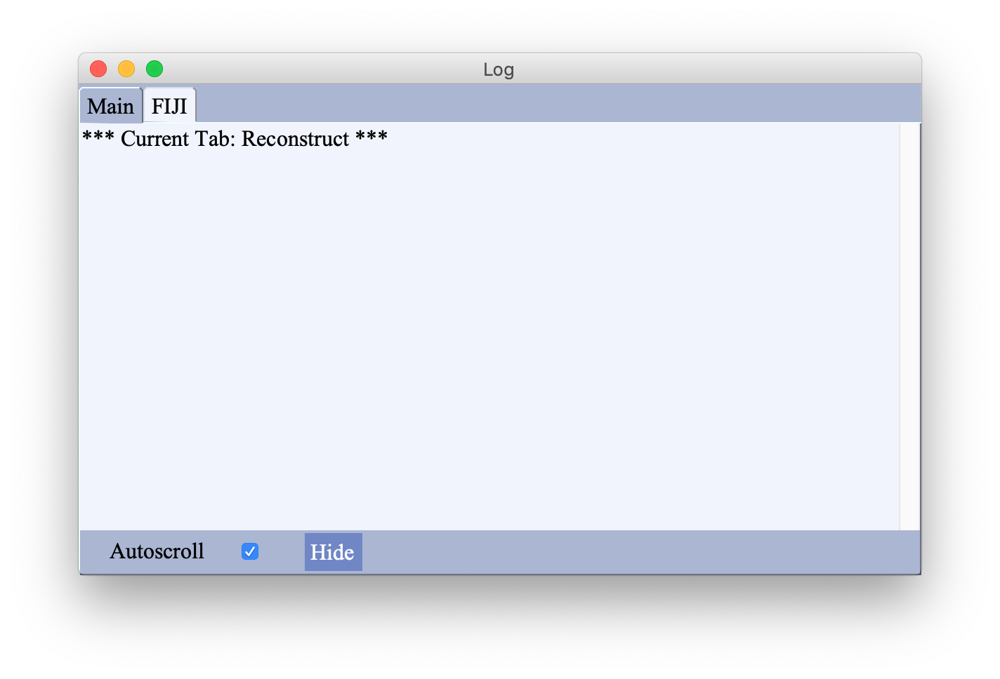

## Final Notes

- The intensive processes of the GUI are handled in threads, so it is completely possible to run a reconstruction while running an alignment. 
- The Fiji processes are run with subprocess calls to the application, so they can only be run one at a time. However they can be queued up to run one after another without any conflicts.
- The macros for the Fiji processes themselves are saved in the ```macros``` folder. These can be run directly in Fiji with Fifi's macro interpreter and any errors can be viewed there.
- The Log can serve as your guide for any issues an error. If you can't solve your error from the Log message, take a look at the contents of your file setup and the contents of the \*.fls file. If your problem keeps repeating, log an issue to PyLorentz Github.